# Cross-domain compositing with temporal time aspect

## Cross-domain compositing setup

Install and import packages

In [1]:
%cd /project_antwerp/cross-domain-compositing
!pip install omegaconf==2.1.1
!pip install einops==0.3.0
!pip install pytorch-lightning==1.4.2
!pip install transformers==4.19.2
!pip install torchmetrics==0.6.0
!pip install -e git+https://github.com/CompVis/taming-transformers.git@master#egg=taming-transformers
!pip install -e git+https://github.com/openai/CLIP.git@main#egg=clip
!pip install kornia==0.6
!pip uninstall tensorflow --yes
!pip uninstall tensorflow-datasets --yes
!pip uninstall tensorflow-addons --yes

import torch
import os

/project_antwerp/cross-domain-compositing
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.7/74.7 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.4/112.4 kB 26.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141211 sha256=9fed869df5569077c6b914eedf89dc32ed11d05d0acac845b2b9f1990701e26a
  Stored in directory: /home/s0191992/.cache/pip/wheels/a7/20/bd/e1477d664f22d99989fd28ee1a43d6633dddb5cb9e801350d5
Successfully built antlr4-python3-runtime
  Attempting uninstall: antlr4-python3-runtime
    Found existing installation: antlr4-python3-runtime 4.9.3
    Uninstalling antlr4-python3-runtime-4.9.3:
      Successfully uninstalled antlr4-python3-runtime-4.9.3
  Attempting uninstall: omegaconf
    Found existing installation: omegaconf 2.3.0
    Uninstalling omegaconf-2.3.0:
      Successfully uninstalled omegaconf-2.3.0
  Attempting uninstall: einops
    Fo

Download pretrained stable diffusion model

In [18]:
HOME = '/project_antwerp'
if not os.path.isfile(f'{HOME}/cross-domain-compositing/models/ldm/stable-diffusion-v1/sd-v1-4.ckpt'):
    !wget -P models/ldm/stable-diffusion-v1 https://huggingface.co/CompVis/stable-diffusion-v-1-4-original/resolve/main/sd-v1-4.ckpt

<font color=green>**Next step:
    place the composites that require processing in the input/images directory, and place their corresponding masks in the input/masks directory**</font>

Remove the unneccessary checkpoint files

In [2]:
%cd /project_antwerp/cross-domain-compositing/input/processed_images
!rm -rf .ipynb_checkpoints
%cd /project_antwerp/cross-domain-compositing/input/processed_masks
!rm -rf .ipynb_checkpoints

/project_antwerp/cross-domain-compositing/input/processed_images
/project_antwerp/cross-domain-compositing/input/processed_masks


## Run the cross-domain compositing

Run cdc python script with chosen parameter values

In [4]:
%cd /project_antwerp/cross-domain-compositing
!rm -r /cdc_output/*
!python scripts_cdc/img2img.py --config configs/stable-diffusion/v1-inference.yaml --ckpt models/ldm/stable-diffusion-v1/sd-v1-4.ckpt --init_img input/processed_images/ --mask input/processed_masks/ --prompt "a sport car driving on a sunny road" --batch_size 1 --n_samples 1 --outdir cdc_output --ddim_steps 50 --strength 0.8 --T_out 1.0 --T_in 0.6 --down_N_out 1 --down_N_in 2 --seed 42 --repaint_start 0.4 --prompt_amplifier_in 1 --skip_grid

/project_antwerp/cross-domain-compositing
rm: cannot remove '/cdc_output/*': No such file or directory
Loading model from models/ldm/stable-diffusion-v1/sd-v1-4.ckpt
Global Step: 470000
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 859.52 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels
Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.23.layer_norm2.bias', 'vision_model.encoder.layers.17.self_attn.out_proj.weight', 'vision_model.encoder.layers.13.self_attn.out_proj.bias', 'vision_model.encoder.layers.0.mlp.fc2.bias', 'vision_model.encoder.layers.8.self_attn.k_proj.bias', 'vision_model.encoder.layers.8.self_attn.q_proj.bias', 'vision_model.encoder.layers.12.layer_norm2.weight', 'vision_model.encoder.layers.20.self_attn.v_proj.bias', 'visio

Show the resulting images

In [21]:
!pip install opencv-python
import cv2
from IPython.display import display, Image
import numpy as np

# Load the three input images
img1 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000000.png')
img2 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000002.png')
img3 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000004.png')

mask1 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000000.png')
mask2 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000002.png')
mask3 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000004.png')

# Resize the input images to the desired shape
height, width, channels = img1.shape
print("Image size: {} x {} pixels, {} channels".format(width, height, channels))

# Create a new image with the desired dimensions
combined_images = np.zeros((1125, 1242, 3), dtype=np.uint8)
combined_masks = np.zeros((1125, 1242, 3), dtype=np.uint8)

# Place the cropped images in a 3x1 grid
combined_images[0:375, 0:1242] = img1
combined_images[375:750, 0:1242] = img2
combined_images[750:1125, 0:1242] = img3

combined_masks[0:375, 0:1242] = mask1
combined_masks[375:750, 0:1242] = mask2
combined_masks[750:1125, 0:1242] = mask3

# Save the combined image
cv2.imwrite('/project_antwerp/cross-domain-compositing/input/processed_images/combined_images.png', cv2.resize(combined_images, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR))
cv2.imwrite('/project_antwerp/cross-domain-compositing/input/processed_masks/combined_masks.png', cv2.resize(combined_masks, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR))

Image size: 1242 x 375 pixels, 3 channels


True

In [48]:
!pip install opencv-python
import cv2
from IPython.display import display, Image
import numpy as np

# Load the three input images
img1 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000002.png')
img2 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000003.png')
img3 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000004.png')
img4 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000005.png')

mask1 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000002.png')
mask2 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000003.png')
mask3 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000004.png')
mask4 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000005.png')

# Resize the input images to the desired shape
height, width, channels = img1.shape
print("Image size: {} x {} pixels, {} channels".format(width, height, channels))

# Create a new image with the desired dimensions
combined_images = np.zeros((375*2, 1242*2, 3), dtype=np.uint8)
combined_masks = np.zeros((375*2, 1242*2, 3), dtype=np.uint8)

# Place the cropped images in a 3x1 grid
combined_images[0:375, 0:1242] = img1
combined_images[0:375, 1242:2484] = img2
combined_images[375:750, 0:1242] = img3
combined_images[375:750, 1242:2484] = img4

combined_masks[0:375, 0:1242] = mask1
combined_masks[0:375, 1242:2484] = mask2
combined_masks[375:750, 0:1242] = mask3
combined_masks[375:750, 1242:2484] = mask4

# Save the combined image
cv2.imwrite('/project_antwerp/cross-domain-compositing/input/processed_images/combined_images_3.png', cv2.resize(combined_images, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR))
cv2.imwrite('/project_antwerp/cross-domain-compositing/input/processed_masks/combined_masks_3.png', cv2.resize(combined_masks, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR))

Image size: 1242 x 375 pixels, 3 channels


True

320 1216


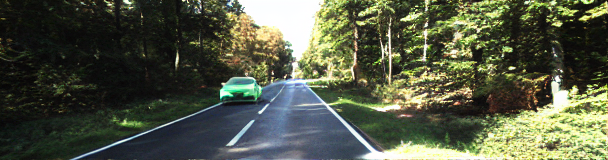

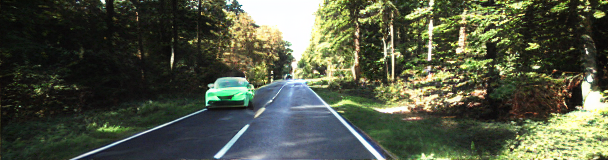

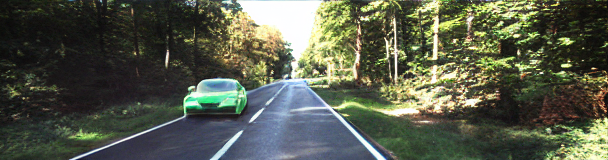

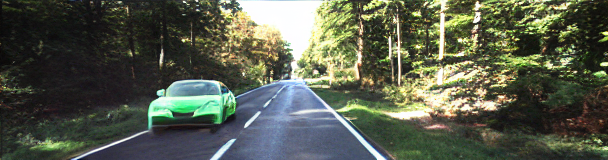

In [8]:
!pip install opencv-python
import cv2
from IPython.display import display, Image
import numpy as np
import os

image = cv2.imread('/project_antwerp/cross-domain-compositing/cdc_output/combined_images_3_00.png')
cv2.resize(image, None, fx=2, fy=2, interpolation=cv2.INTER_LINEAR)
height, width, channels = image.shape
print(height, width)
img1 = image[0:160, 0:608]
img2 = image[0:160, 608:1216]
img3 = image[160:320, 0:608]
img4 = image[160:320, 608:1216]

cv2.imwrite('/project_antwerp/cross-domain-compositing/cdc_output/new/img1.png', img1)
cv2.imwrite('/project_antwerp/cross-domain-compositing/cdc_output/new/img2.png', img2)
cv2.imwrite('/project_antwerp/cross-domain-compositing/cdc_output/new/img3.png', img3)
cv2.imwrite('/project_antwerp/cross-domain-compositing/cdc_output/new/img4.png', img4)

for image in sorted(os.listdir('cdc_output/new')):
    if image.endswith('.png'):
        display(Image(f'cdc_output/new/{image}'))

In [9]:
# Define the file paths of the input images
img1_path = '/project_antwerp/cross-domain-compositing/cdc_output/new/img1.png'
img2_path = '/project_antwerp/cross-domain-compositing/cdc_output/new/img2.png'
img3_path = '/project_antwerp/cross-domain-compositing/cdc_output/new/img3.png'
img4_path = '/project_antwerp/cross-domain-compositing/cdc_output/new/img4.png'

# Create a list of image file paths
img_paths = [img1_path, img2_path, img3_path, img4_path]

# Load the first image to get its dimensions
img = cv2.imread(img_paths[0])
height, width, channels = img.shape

# Define the video codec and create a VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_path = '/project_antwerp/cross-domain-compositing/cdc_output/new/output_video.mp4'
video = cv2.VideoWriter(video_path, fourcc, 25, (width, height))

# Iterate through the image file paths and write each image to the video
for path in img_paths:
    img = cv2.imread(path)
    video.write(img)

# Release the VideoWriter object and destroy all windows
video.release()
cv2.destroyAllWindows()


In [33]:
!pip install opencv-python
import cv2
from IPython.display import display, Image
import numpy as np

# Load the three input images
img1 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000000.png')
img2 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000002.png')
img3 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000004.png')

mask1 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000000.png')
mask2 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000002.png')
mask3 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000004.png')

# Resize the images and masks to 512x512
img1 = cv2.resize(img1, (512, 512))
img2 = cv2.resize(img2, (512, 512))
img3 = cv2.resize(img3, (512, 512))

mask1 = cv2.resize(mask1, (512, 512))
mask2 = cv2.resize(mask2, (512, 512))
mask3 = cv2.resize(mask3, (512, 512))

# Create a new image with the desired dimensions
combined_images = np.zeros((512*2, 512*2, 3), dtype=np.uint8)
combined_masks = np.zeros((512*2, 512*2, 3), dtype=np.uint8)

# Place the cropped images in a 3x1 grid
combined_images[0:512, 0:512] = img1
combined_images[0:512, 512:1024] = img2
combined_images[512:1024, 0:512] = img3

combined_masks[0:512, 0:512] = mask1
combined_masks[0:512, 512:1024] = mask2
combined_masks[512:1024, 0:512] = mask3

# Save the combined image
cv2.imwrite('/project_antwerp/cross-domain-compositing/input/processed_images/combined_images_2.png', cv2.resize(combined_images, None, fx=0.7, fy=0.7, interpolation=cv2.INTER_LINEAR))
cv2.imwrite('/project_antwerp/cross-domain-compositing/input/processed_masks/combined_masks_2.png', cv2.resize(combined_masks, None, fx=0.7, fy=0.7, interpolation=cv2.INTER_LINEAR))

True

In [44]:
###with equal mask size
!pip install opencv-python
import cv2
from IPython.display import display, Image
import numpy as np

# Load the three input images
img1 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000003.png')
img2 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000004.png')
img3 = cv2.imread('/project_antwerp/cross-domain-compositing/input/images/0000000005.png')

mask1 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000003.png')
mask2 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000004.png')
mask3 = cv2.imread('/project_antwerp/cross-domain-compositing/input/masks/0000000005.png')

img1 = cv2.resize(img1, None, fx=1.4, fy=1.4, interpolation=cv2.INTER_LINEAR)
img2 = cv2.resize(img2, None, fx=1.2, fy=1.2, interpolation=cv2.INTER_LINEAR)

mask1 = cv2.resize(mask1, None, fx=1.4, fy=1.4, interpolation=cv2.INTER_LINEAR)
mask2 = cv2.resize(mask2, None, fx=1.2, fy=1.2, interpolation=cv2.INTER_LINEAR)

cv2.imwrite('/project_antwerp/cross-domain-compositing/input/test_images/test_1.png', img1)
cv2.imwrite('/project_antwerp/cross-domain-compositing/input/test_masks/test_1.png', mask1)

cv2.imwrite('/project_antwerp/cross-domain-compositing/input/test_images/test_2.png', img2)
cv2.imwrite('/project_antwerp/cross-domain-compositing/input/test_masks/test_2.png', mask2)

cv2.imwrite('/project_antwerp/cross-domain-compositing/input/test_images/test_3.png', img3)
cv2.imwrite('/project_antwerp/cross-domain-compositing/input/test_masks/test_3.png', mask3)

True

Originals:


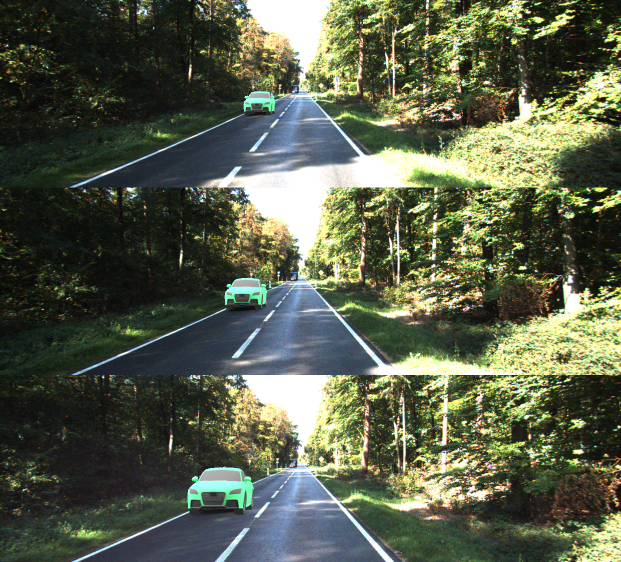

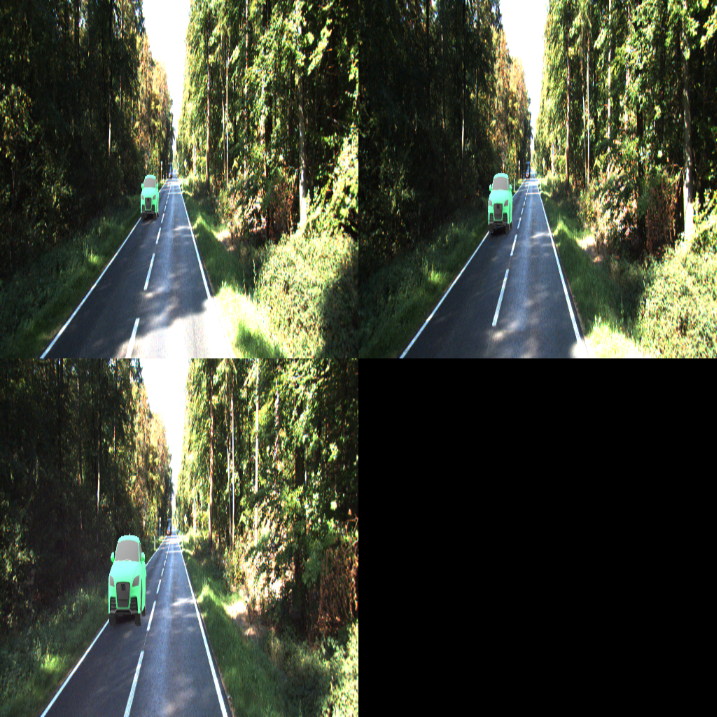

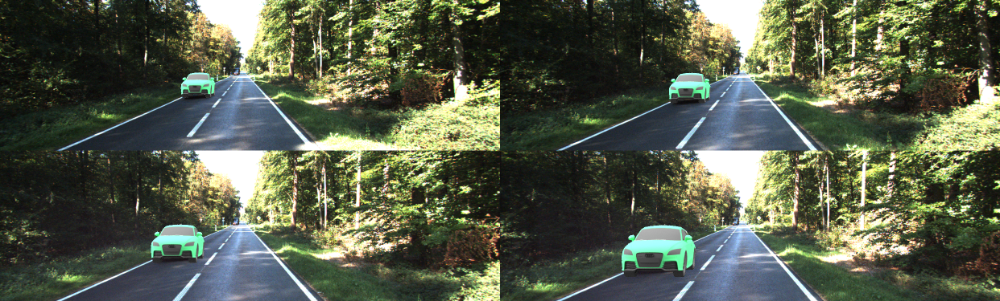

Updated:


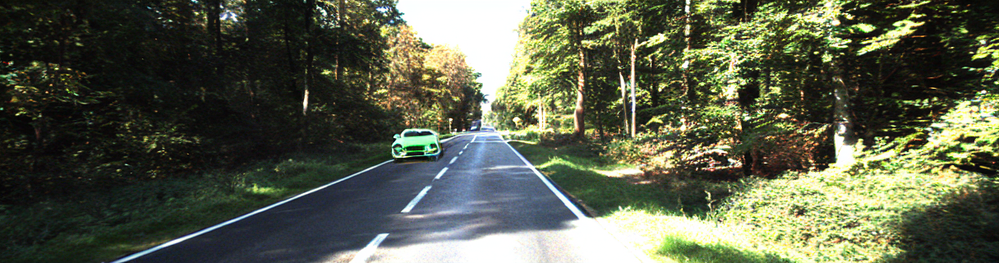

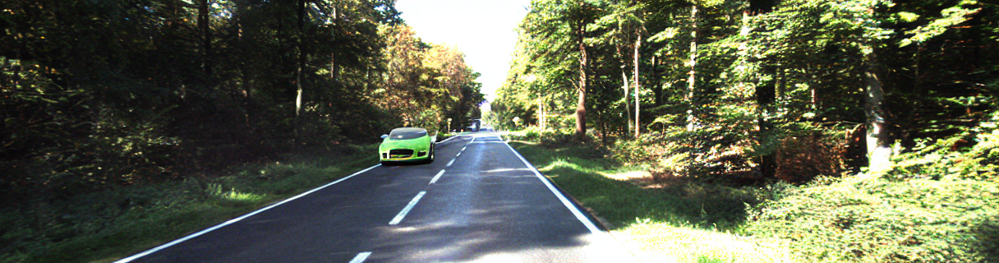

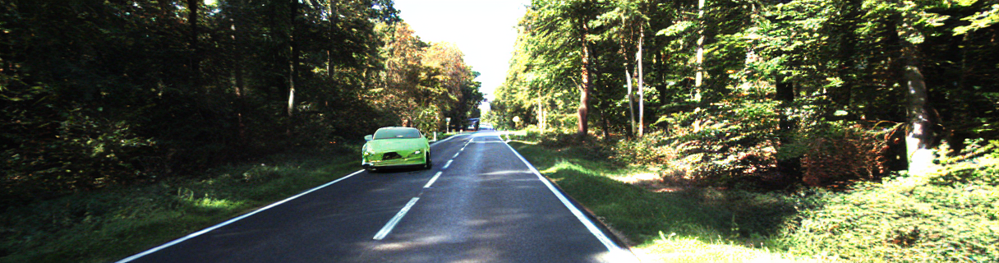

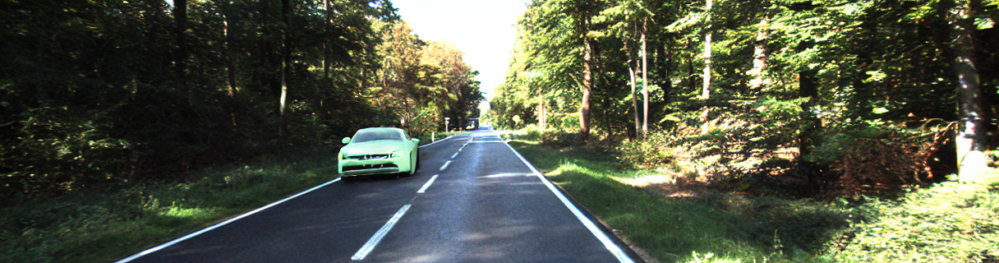

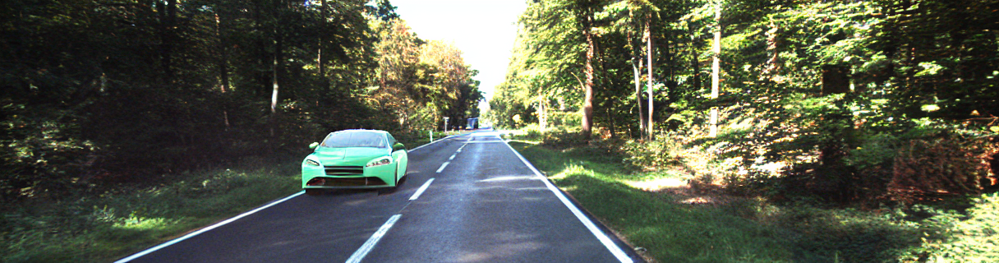

...

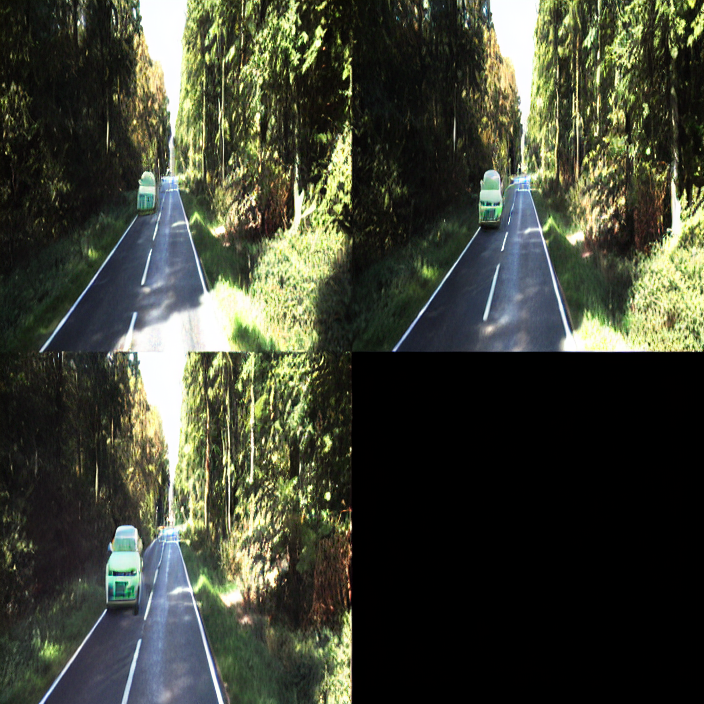

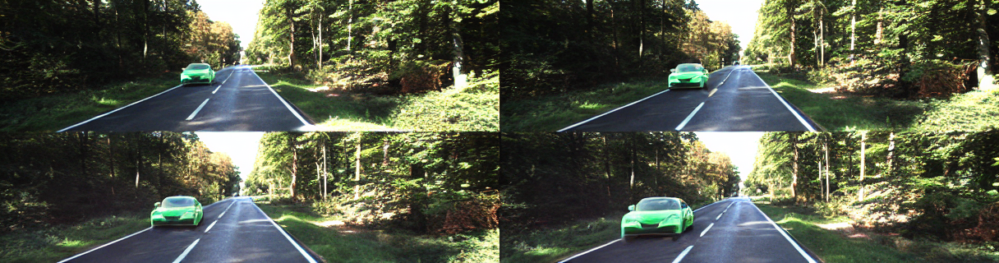

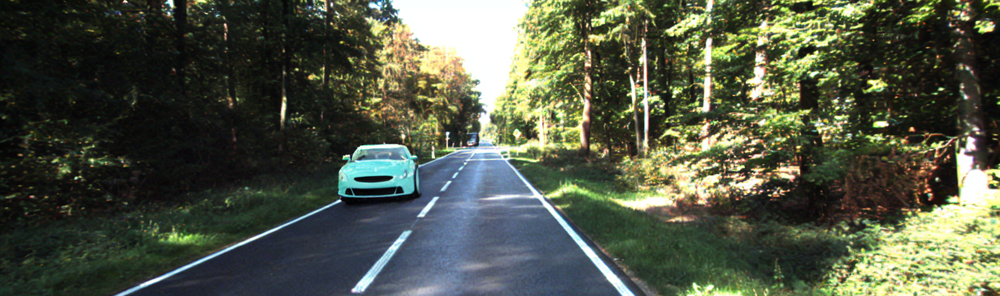

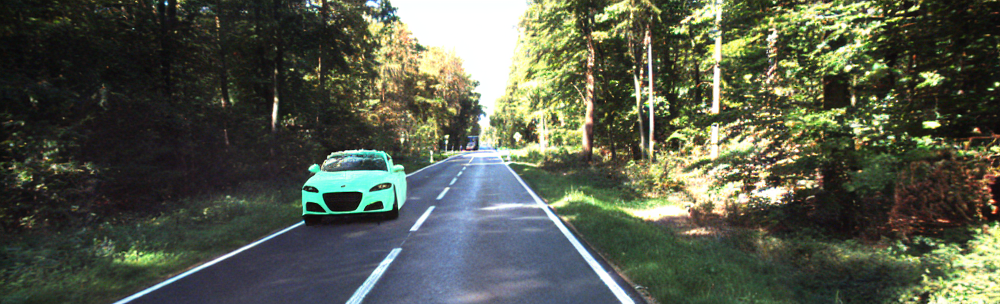

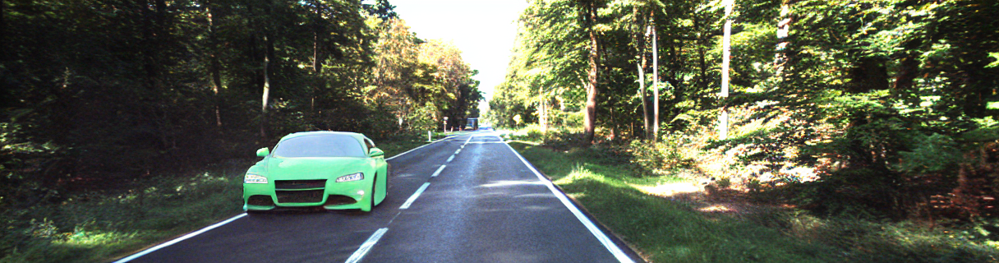

In [51]:
from IPython.display import display, Image

print('Originals:')
for image in sorted(os.listdir('input/processed_images')):
    if image.endswith('.png'):
        display(Image(f'input/processed_images/{image}'))
    
print('Updated:')
for result in sorted(os.listdir('cdc_output')):
    if result.endswith('.png'):
        display(Image(f'cdc_output/{result}'))

## Frame interpolation setup

Clone the frame-interpolation repository

In [16]:
if not os.path.isdir(f'{HOME}/frame-interpolation'):
    %cd /project_antwerp
    !git clone https://github.com/google-research/frame-interpolation

Install requirements

In [29]:
%cd /project_antwerp/frame-interpolation
#!sudo apt-get update
#!sudo apt-get install -y python3-pip
#!conda update ffmpeg --yes
!pip install pyarrow==9.0.0
!pip install -r requirements.txt

/project_antwerp/frame-interpolation


Download pretrained models

In [30]:
import os
if not os.path.isdir('/project_antwerp/frame-interpolation/pretrained_models'):
    !gdown 1C1YwOo293_yrgSS8tAyFbbVcMeXxzftE -O pretrained_models-20220214T214839Z-001.zip
    !unzip -o "pretrained_models-20220214T214839Z-001.zip"
    !rm -rf pretrained_models-20220214T214839Z-001.zip

## Run frame interpolation

In [34]:
%cd /project_antwerp/frame-interpolation
input_folder = '/project_antwerp/cross-domain-compositing/cdc_output'
recursion_times = 6
!sudo apt-get update
!sudo apt-get install libopenh264
model_path = '/project_antwerp/frame-interpolation/pretrained_models/film_net/Style/saved_model'
!python3 -m eval.interpolator_cli \
   --pattern $input_folder \
   --model_path $model_path \
   --times_to_interpolate $recursion_times \
   --output_video

/project_antwerp/frame-interpolation
Hit:1 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease                         
Hit:4 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Reading package lists... Done
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
E: Unable to locate package libopenh264
I0410 15:15:57.320790 140294016636736 environments.py:376] Default Python SDK image for environment is apache/beam_python3.10_sdk:2.46.0
I0410 15:15:57.363452 140294016636736 translations.py:710] ==================== <function annotate_downstream_side_inputs at 0x7f982703e4d0> ====================
I0410 15:15:57.363741 140294016636736 translations.py:710] ==================== <function fix_side_input_pcoll_coders at 0x7f982703e

Show the interpolated video

In [ ]:
import mediapy as media
video = media.read_video('/output_cdc/interpolated.mp4')
media.show_video(video, fps=30)